In [1]:
import os

os.environ['XLA_FLAGS'] = '--xla_gpu_cuda_data_dir=/opt/cuda'

In [2]:
from datetime import datetime
from math import ceil, floor
from pathlib import Path
import random

import astropy.io.fits as fits
import cv2 as cv
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras


2024-12-10 16:10:00.901117: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733847000.915809  440261 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733847000.920118  440261 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-10 16:10:00.933734: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
# Constants

dataset_path = Path("/home/sergio/Desktop/isod-dataset/")

# nn_input_shape = (512, 512)
nn_input_shape = (256, 256)

In [22]:
# Load the dataset
print("Loading dataset...", end="\n\n")

def load_dataset(current_dataset_path):
    current_dataset = {}

    # Process each entry in the dataset
    for entry_path in current_dataset_path.iterdir():
        if not entry_path.is_dir():
            print(f"Skipping non-directory item: {entry_path}")
            continue

        entry_id = entry_path.name

        try:
            # Load the image
            image_path = entry_path / f"{entry_id}.fits"
            with fits.open(image_path) as image_hdu_list:
                fits_image = image_hdu_list[0].data

            # Load the detected objects' information
            objects_path = entry_path / f"{entry_id}-axy.fits"
            with fits.open(objects_path) as axy_hdu_list:
                detected_objects = axy_hdu_list[1].data

        except TypeError:
            print(f"Skipping too large entry: {entry_id}")
            continue
        except OSError:
            print(f"Skipping empty or corrupt entry: {entry_id}")
            continue

        # Convert the image shape to the standard format to be easily handled and to monochrome
        if len(fits_image.shape) == 3 and fits_image.shape[0] == 3:
            try:
                original_image = np.rollaxis(fits_image, 0, 3)
                monochrome_image = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)

            except cv.error:
                print(f"Warning! Error converting to monochrome image at entry {entry_id}")
                continue

        elif len(fits_image.shape) == 2:  # Image is monochrome
            original_image = fits_image
            monochrome_image = fits_image

        else:
            print(f"Warning! Unknown image shape found at entry {entry_id} with shape {fits_image.shape}")
            continue

        # Normalize pixel values between 0 and 1
        normalized_image = (monochrome_image / monochrome_image.max())
        if normalized_image.max() != 1.0:
            print(f"Warning! Unknown value found while normalizing entry {entry_id}")
            continue

        # Resize image
        resized_image = cv.resize(normalized_image, nn_input_shape)

        # Extract relevant information from the detected objects on the image
        objects_info = np.stack([detected_objects["X"], detected_objects["Y"], detected_objects["FLUX"]], axis=-1)

        # Create a segmentation mask based on the detected objects' locations
        #   - Background = 0
        #   - Detected object = 1
        segmentation_mask = np.zeros_like(resized_image).astype(np.uint8)

        radius = 2
        filtered_objects_info = []
        for object_info in objects_info:
            original_x_coord, original_y_coord, object_flux = object_info

            # Adapt object coordinates to the resized image
            adapted_x_coord = (original_x_coord * nn_input_shape[1]) / original_image.shape[1]
            adapted_y_coord = (original_y_coord * nn_input_shape[0]) / original_image.shape[0]

            if object_flux > 70:
                filtered_objects_info.append((
                    adapted_x_coord,
                    adapted_y_coord,
                    object_flux,
                ))

                # Calculate the bounding box of the object inside the image
                lower_x_coord = floor(min(
                    max((adapted_x_coord - radius), 0),
                    nn_input_shape[1],
                ))
                upper_x_coord = ceil(max(
                    min((adapted_x_coord + radius), nn_input_shape[1]),
                    0,
                ))
                lower_y_coord = floor(min(
                    max((adapted_y_coord - radius), 0),
                    nn_input_shape[0],
                ))
                upper_y_coord = ceil(max(
                    min((adapted_y_coord + radius), nn_input_shape[0]),
                    0,
                ))

                # Add the bounding box to the mask
                segmentation_mask[
                    lower_y_coord : upper_y_coord,
                    lower_x_coord : upper_x_coord,
                ] = 1

        nn_input_image = resized_image

        # Store dataset entry information
        current_dataset[entry_id] = {
            # "original_image": original_image,
            "nn_input_image": nn_input_image.copy(),
            # "objects_info": objects_info,
            "filtered_objects_info": filtered_objects_info.copy(),
            "segmentation_mask": segmentation_mask.copy(),
        }

    return current_dataset


dataset = load_dataset(dataset_path)
print(f"Dataset created containing {len(dataset)} entries")


Loading dataset...

Dataset created containing 1183 entries


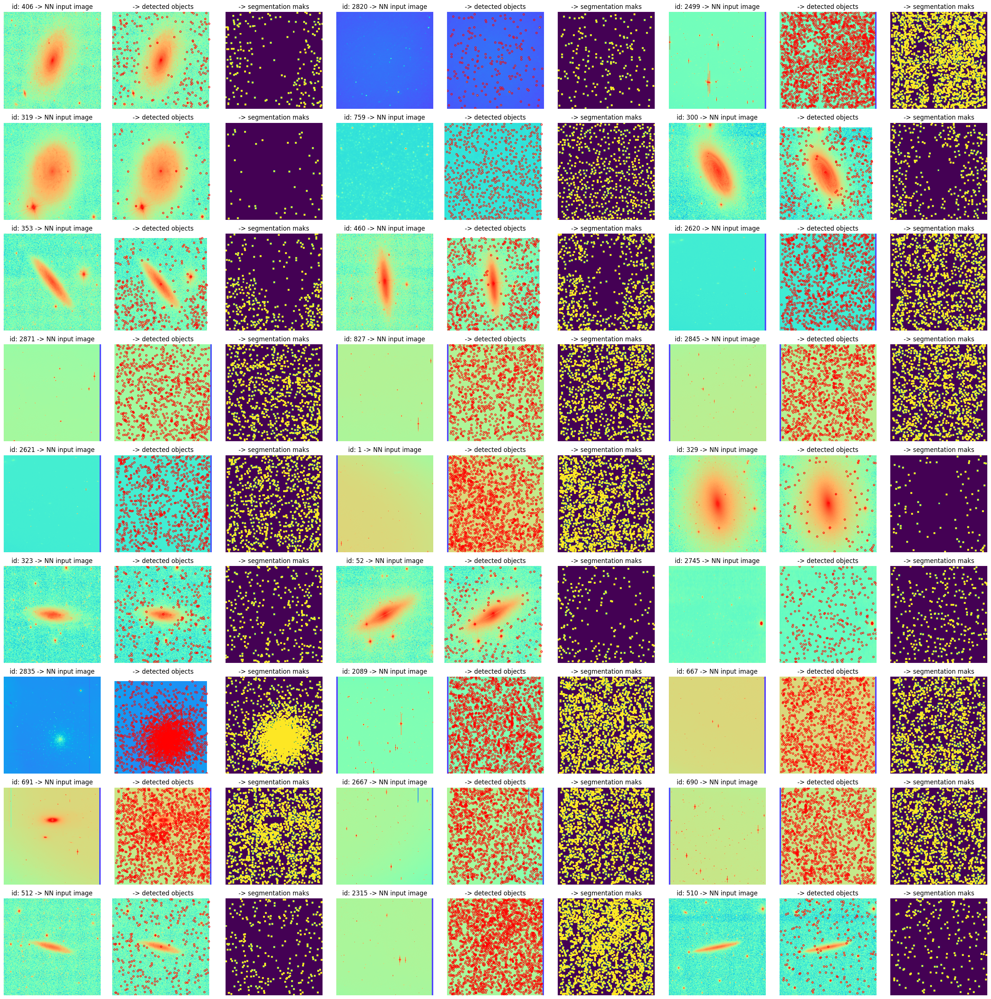

In [5]:
# Dataset sample preview:

# Prepare the plot
rows, cols, subcols = 9, 3, 3
_, axs = plt.subplots(rows, (cols * subcols), figsize=((cols * subcols) * 3, rows * 3))

samples_entries_ids = random.sample(list(dataset.keys()), rows * cols)

for i in range(rows):
    for j in range(cols):
        x_axs_id = i
        y_axs_id = j * subcols

        sample_entry_id = samples_entries_ids[i * cols + j]

        axs[x_axs_id, y_axs_id].axis("off")
        axs[x_axs_id, y_axs_id].set_title(f"id: {sample_entry_id} -> NN input image")
        axs[x_axs_id, y_axs_id].imshow(dataset[sample_entry_id]["nn_input_image"], cmap="rainbow", origin="lower", norm=PowerNorm(gamma=0.3))

        axs[x_axs_id, y_axs_id + 1].axis("off")
        axs[x_axs_id, y_axs_id + 1].set_title(f"-> detected objects")
        axs[x_axs_id, y_axs_id + 1].imshow(dataset[sample_entry_id]["nn_input_image"], cmap="rainbow", origin="lower", norm=PowerNorm(gamma=0.3))
        axs[x_axs_id, y_axs_id + 1].scatter(*(list(zip(*dataset[sample_entry_id]["filtered_objects_info"]))[:2]), s=10, edgecolors="black", facecolors="none")

        axs[x_axs_id, y_axs_id + 2].axis("off")
        axs[x_axs_id, y_axs_id + 2].set_title("-> segmentation maks")
        axs[x_axs_id, y_axs_id + 2].imshow(dataset[sample_entry_id]["segmentation_mask"], cmap="viridis", origin="lower")

# Show the plot
plt.tight_layout()
plt.savefig("./dataset_sample.png", dpi=500)
plt.show()

In [6]:
# Split dataset into training and validation

train_dataset, test_and_val_datasets = train_test_split(list(dataset.items()), train_size=0.5, shuffle=True)
test_dataset, val_dataset = train_test_split(test_and_val_datasets, train_size=0.5, shuffle=True)

train_dataset = dict(train_dataset)
test_dataset = dict(test_dataset)
val_dataset = dict(val_dataset)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")

Train dataset size: 591
Test dataset size: 296
Validation dataset size: 296


In [7]:
# Adapt training and validation datasets to the model input

def dataset_to_torch_tensors(current_dataset):
    """
    Function to convert a dataset into independent tensors each containing the
    images and the masks.
    """

    images = []
    masks = []

    for entry in current_dataset.values():
        images.append(entry["nn_input_image"].tolist())
        masks.append(entry["segmentation_mask"].tolist())

    # return torch.tensor(np.array(images)), torch.tensor(np.array(masks))
    return tf.convert_to_tensor(images), tf.convert_to_tensor(masks)


train_images, train_masks = dataset_to_torch_tensors(train_dataset)
val_images, val_masks = dataset_to_torch_tensors(val_dataset)

I0000 00:00:1733847043.053414  440261 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4313 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:0a:00.0, compute capability: 7.5
2024-12-10 16:10:43.053945: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 154927104 exceeds 10% of free system memory.
2024-12-10 16:10:48.227343: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 154927104 exceeds 10% of free system memory.
2024-12-10 16:10:52.872592: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 77594624 exceeds 10% of free system memory.
2024-12-10 16:10:55.358924: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 77594624 exceeds 10% of free system memory.
2024-12-10 16:10:59.629689: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 77594624 exceeds 10% of free system memory.


In [8]:
# Define and create the neural network model

def create_image_segmentation_model(input_shape, num_classes):
    """Function to define the neural network model architecture."""

    # Input layer
    inputs = keras.Input(shape=input_shape)

    # Encoder
    conv1 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(inputs)
    conv1 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(conv1)
    pool1 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(pool1)
    conv2 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(conv2)
    pool2 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(pool2)
    conv3 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(conv3)
    pool3 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(pool3)
    conv4 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(conv4)
    pool4 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bridge
    conv5 = keras.layers.Conv2D(1024, 3, activation="relu", padding="same")(pool4)
    conv5 = keras.layers.Conv2D(1024, 3, activation="relu", padding="same")(conv5)

    # Decoder
    up6 = keras.layers.UpSampling2D(size=(2, 2))(conv5)
    up6 = keras.layers.Conv2D(512, 2, activation="relu", padding="same")(up6)
    concat6 = keras.layers.concatenate([conv4, up6], axis=3)
    conv6 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(concat6)
    conv6 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(conv6)

    up7 = keras.layers.UpSampling2D(size=(2, 2))(conv6)
    up7 = keras.layers.Conv2D(256, 2, activation="relu", padding="same")(up7)
    concat7 = keras.layers.concatenate([conv3, up7], axis=3)
    conv7 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(concat7)
    conv7 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(conv7)

    up8 = keras.layers.UpSampling2D(size=(2, 2))(conv7)
    up8 = keras.layers.Conv2D(128, 2, activation="relu", padding="same")(up8)
    concat8 = keras.layers.concatenate([conv2, up8], axis=3)
    conv8 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(concat8)
    conv8 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(conv8)

    up9 = keras.layers.UpSampling2D(size=(2, 2))(conv8)
    up9 = keras.layers.Conv2D(64, 2, activation="relu", padding="same")(up9)
    concat9 = keras.layers.concatenate([conv1, up9], axis=3)
    conv9 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(concat9)
    conv9 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(conv9)

    # Output layer
    outputs = keras.layers.Conv2D(num_classes, 1, activation="softmax")(conv9)

    # Create the model
    return keras.Model(inputs=inputs, outputs=outputs)


# Create an instance of the image segmentation model
model = create_image_segmentation_model(
    input_shape=(*nn_input_shape, 1),  # Monochrome image
    num_classes=2  # 0 for background, 1 for sky object
)

# Compile the model
model.compile(
    optimizer='adam',
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

# Print model summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 16, 16,    │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ conv2d_9[0][0]    │
│ (UpSampling2D)      │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 32, 32,    │  2,097,664 │ up_sampling2d[0]

 Total params: 31,030,658 (118.37 MB)

 Trainable params: 31,030,658 (118.37 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
history = model.fit(
    train_images,
    train_masks,
    validation_data=(val_images, val_masks),
    batch_size=6,
    epochs=50,
    callbacks=[
        # keras.callbacks.EarlyStopping(monitor="val_loss", patience=5),
        keras.callbacks.ModelCheckpoint(
            filepath=str(f"./trained-models/model-{datetime.now().strftime('%Y_%m_%d-%H_%M_%S')}.ckpnt.keras"),
            monitor="val_loss",
            save_best_only=True,
        ),
    ],
)

Epoch 1/50


I0000 00:00:1733847067.282945  447511 service.cc:148] XLA service 0x708438001fa0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733847067.282983  447511 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1660 Ti, Compute Capability 7.5
2024-12-10 16:11:07.390532: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
W0000 00:00:1733847067.613764  447511 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
I0000 00:00:1733847067.922304  447511 cuda_dnn.cc:529] Loaded cuDNN version 90501
2024-12-10 16:11:08.191293: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=0} for conv (f32[6,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[6,1,256,256]{3,2,1,0}

98/99 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step - loss: 0.7352 - sparse_categorical_accuracy: 0.7676

W0000 00:00:1733847133.517233  447511 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
2024-12-10 16:12:14.876733: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=0} for conv (f32[3,512,32,32]{3,2,1,0}, u8[0]{0}) custom-call(f32[3,256,32,32]{3,2,1,0}, f32[512,256,3,3]{3,2,1,0}, f32[512]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2024-12-10 16:12:15.123133: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=0} for conv (f32[3,512,32,32]{3,2,1,0}

99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - loss: 0.7338 - sparse_categorical_accuracy: 0.7676

W0000 00:00:1733847151.186421  447511 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
2024-12-10 16:12:31.267012: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=0} for conv (f32[6,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[6,1,256,256]{3,2,1,0}, f32[64,1,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2024-12-10 16:12:31.303937: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=0} for conv (f32[6,64,256,256]{3,2,1,0}, 

99/99 ━━━━━━━━━━━━━━━━━━━━ 106s 768ms/step - loss: 0.7323 - sparse_categorical_accuracy: 0.7676 - val_loss: 0.5059 - val_sparse_categorical_accuracy: 0.7704
Epoch 2/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 43s 438ms/step - loss: 0.5056 - sparse_categorical_accuracy: 0.7714 - val_loss: 0.5066 - val_sparse_categorical_accuracy: 0.7771
Epoch 3/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 44s 442ms/step - loss: 0.4969 - sparse_categorical_accuracy: 0.7772 - val_loss: 0.4723 - val_sparse_categorical_accuracy: 0.7895
Epoch 4/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 43s 437ms/step - loss: 0.5058 - sparse_categorical_accuracy: 0.7785 - val_loss: 0.4901 - val_sparse_categorical_accuracy: 0.7704
Epoch 5/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 43s 438ms/step - loss: 0.4900 - sparse_categorical_accuracy: 0.7724 - val_loss: 0.4900 - val_sparse_categorical_accuracy: 0.7781
Epoch 6/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 43s 438ms/step - loss: 0.4840 - sparse_categorical_accuracy: 0.7713 - val_loss: 0.4930 - val_sparse_categorical_accuracy: 0.7801
Epoch 7/

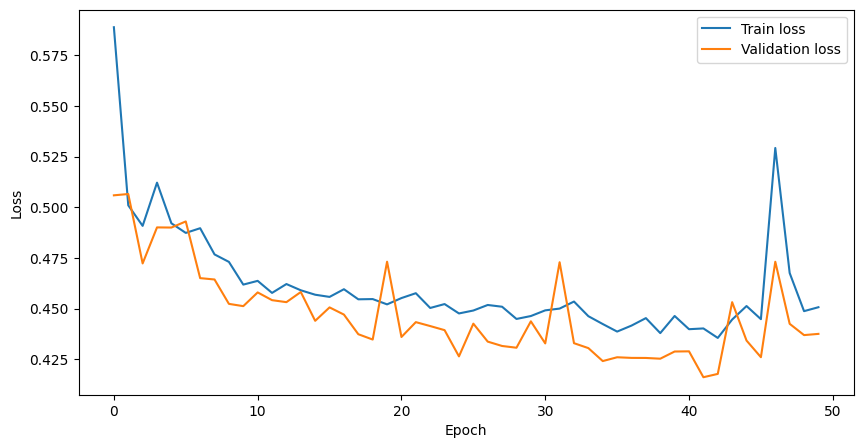

Loss curves saved to: ./loss_history.png


In [10]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

ax.plot(history.history["loss"], label="Train loss")
ax.plot(history.history["val_loss"], label="Validation loss")

ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()

result_image_path = "./loss_history.png"

plt.savefig(result_image_path)
plt.show()

print("Loss curves saved to:", result_image_path)

In [11]:
model.save(f"./trained-models/model-{datetime.now().strftime('%Y_%m_%d-%H_%M_%S')}.keras")
# model = keras.models.load_model("./trained-models/model-....keras")

In [69]:
def detect_sky_objects(input_image, model):
    """Function to apply the model inference over the given image."""

    # Adapt the input image to the model input format
    input_tensor = tf.convert_to_tensor([input_image])

    # Apply the model to the input image
    predicted_mask = model.predict(input_tensor)[0]

    # Reverse the one-hot encoding to create a single segmentation mask
    result_mask = np.argmax(predicted_mask, axis=-1)

    return result_mask


# sample_test_entry_id = random.choice(list(test_dataset.keys()))
# inference_result_segmentation_mask = detect_sky_objects(test_dataset[sample_test_entry_id]["nn_input_image"], model)


In [72]:
def get_sky_objects_positions(segmentation_mask):
    """
    Function to get the central positions of the detected objects at the given
    segmentation mask.
    """

    # Get the contours of each detected region
    contours, _ = cv.findContours(
        segmentation_mask,
        cv.RETR_LIST,
        cv.CHAIN_APPROX_SIMPLE,
    )

    min_detected_object_size = 10
    sky_objects_positions = []
    for contour in contours:
        if cv.contourArea(contour) < min_detected_object_size:
            continue

        # Get the bounding box of each contour
        corner_x_coord, corner_y_coord, width, height = cv.boundingRect(contour)

        # Get the center of the bounding box
        center_x_coord = corner_x_coord + width / 2
        center_y_coord = corner_y_coord + height / 2

        # Add the center coordinates to the list of detected objects positions
        sky_objects_positions.append((center_x_coord, center_y_coord))

    return sky_objects_positions


# detected_sky_objects_positions = get_sky_objects_positions(inference_result_segmentation_mask.astype(np.uint8))



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━

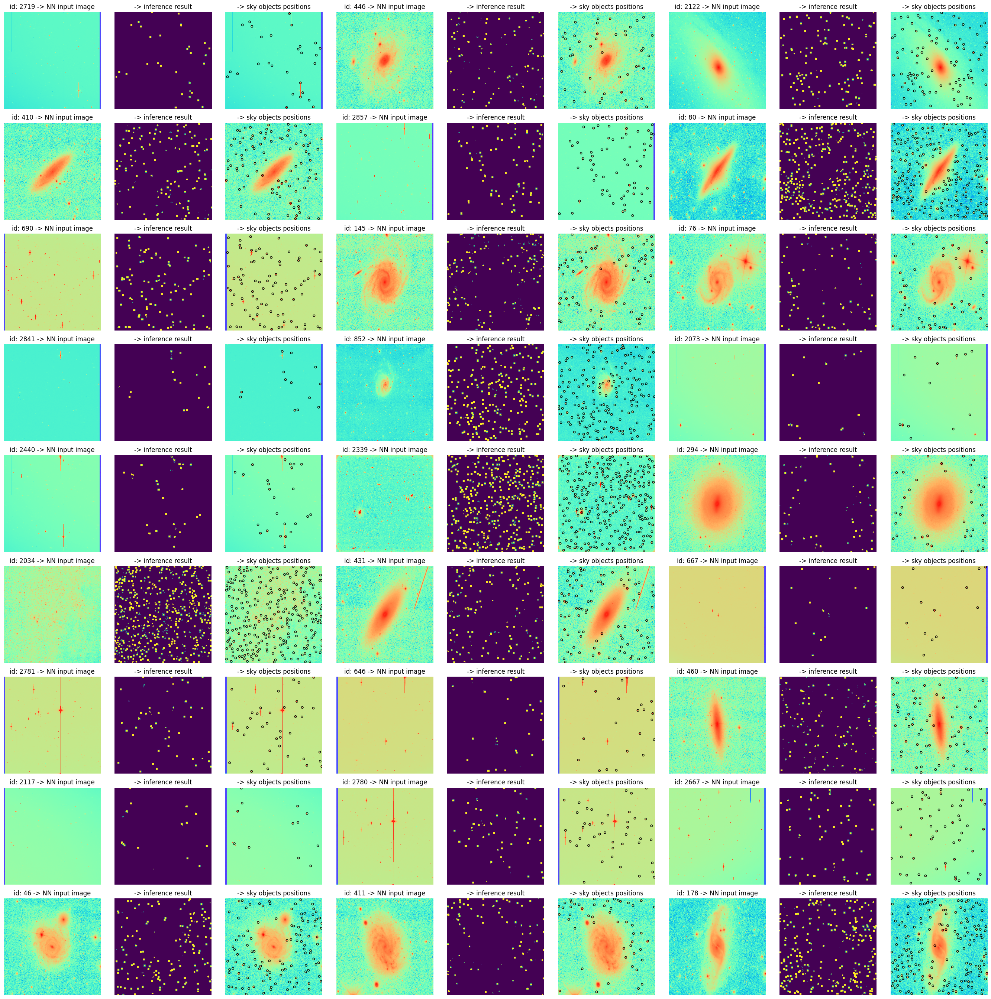

In [74]:
# Inference result

rows, cols, subcols = 9, 3, 3
_, axs = plt.subplots(rows, (cols * subcols), figsize=((cols * subcols) * 3, rows * 3))

samples_test_entries_ids = random.sample(list(test_dataset.keys()), rows * cols)

for i in range(rows):
    for j in range(cols):
        x_axs_id = i
        y_axs_id = j * subcols

        sample_test_entry_id = samples_test_entries_ids[i * cols + j]
        sample_test_entry_image = test_dataset[sample_test_entry_id]["nn_input_image"]

        # Detect the sky objects of the test image
        inference_result_mask = detect_sky_objects(sample_test_entry_image, model).astype(np.uint8)
        sky_objects_positions = get_sky_objects_positions(inference_result_mask)

        axs[x_axs_id, y_axs_id].axis("off")
        axs[x_axs_id, y_axs_id].set_title(f"id: {sample_test_entry_id} -> NN input image")
        axs[x_axs_id, y_axs_id].imshow(sample_test_entry_image, cmap="rainbow", origin="lower", norm=PowerNorm(gamma=0.3))

        axs[x_axs_id, y_axs_id + 1].axis("off")
        axs[x_axs_id, y_axs_id + 1].set_title("-> inference result")
        axs[x_axs_id, y_axs_id + 1].imshow(inference_result_mask, cmap="viridis", origin="lower")

        axs[x_axs_id, y_axs_id + 2].axis("off")
        axs[x_axs_id, y_axs_id + 2].set_title("-> sky objects positions")
        axs[x_axs_id, y_axs_id + 2].imshow(sample_test_entry_image, cmap="rainbow", origin="lower", norm=PowerNorm(gamma=0.3))
        axs[x_axs_id, y_axs_id + 2].scatter(*zip(*sky_objects_positions), s=15, edgecolors="black", facecolors="none")

# Show the plot
plt.tight_layout()
plt.savefig("./inference_result.png", dpi=500)
plt.show()